In [1]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats

#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

dataframe (Dataframe) - contains CMIP6 intake json 

In [2]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [3]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'

In [4]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [5]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


### Empirical data

In [6]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(parent_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [7]:
Landuse_all = xr.open_dataset(parent_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

#### Defining functions

In [8]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

In [9]:
#Funtion to calulate days per month as a constant funtion (needs to be multiplied to CMIP6-precipitation estimates)
def sum_of_day(year_start, year_end, lat_1, lon_2):
    sum_of_day = []
    year = 0
    for year in range(year_start,year_end+1):
        for month in range(1,13):
            sum_of_day.append(monthrange(year, month)[1]*(np.ones((lat_1, lon_2)))*86400)
    sum_of_day = (np.array(sum_of_day))
    return sum_of_day

In [10]:
def calc_Seasonality(data):
    # Input is monthly data of precipitation
    Seasonality = []
    for lat in range(data.shape[1]):
        for lon in range(data.shape[2]):
            Seasonality.append(((1/data[:,lat,lon].sum())*(np.array([abs((data[i,lat,lon]-(data[:,lat,lon].sum()/12))) for i in range(12)]).sum())))
    Seasonality = (np.array(Seasonality).reshape(data.shape[1],data.shape[2]))
    return Seasonality

In [11]:
def interp_selfilter(file, Landuse,lat_min,lat_max,lon_min,lon_max):
    if isinstance(file,(np.ndarray)):
        file = xr.DataArray(file, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit"))
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    else:
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    return file

In [12]:
def boxplot_custom(order, data, ax=None, **kwargs):
    ax = ax or plt.gca()
    data = remove_outliers(data, data.columns[0])
    ax.plot([data.quantile(0.25)[0], data.quantile(0.75)[0]], [order, order], **kwargs, lw = 2.5, color = 'black', zorder=1)
    ax.plot([data.quantile(0.025)[0], data.quantile(0.975)[0]], [order, order], **kwargs, lw = 1, color = 'black', zorder=0)
    #ax.plot([(data.quantile(0.25)[0]-1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0])), 
    #        (data.quantile(0.75)[0]+1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0]))], [0,0], **kwargs, lw = 1, color = 'black', zorder=0) 
    ax.scatter(data.median(), order, **kwargs, s = 150, edgecolors = 'black', lw = 2.5, facecolor = '#8c6bb1', zorder=2);
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.get_yaxis().set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    return data.quantile(0.025)[0], data.quantile(0.25)[0], data.quantile(0.75)[0], data.quantile(0.975)[0];

In [13]:
def forest_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_sel = Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
            #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
            pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                       pd.DataFrame({'Landuse': Landuse_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                       pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()

    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    """
    df_full = pd.DataFrame({'Precip_yearly': (dataframe.filter(like='Precip').dropna()).sum(axis = 1), 
              'Seasonality': seasonality})
    """
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    sz = dataframe['Precip'].size-1
    dataframe['Precip_percentile'] = dataframe['Precip'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    dataframe['Seasonality_percentile'] = dataframe['Seasonality'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)
    dataframe = dataframe[['Sr','Precip','Seasonality','Precip_percentile','Seasonality_percentile']]
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [14]:
def savanna_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_only_savanna_sel = Landuse_only_savanna.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
        #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
        pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                   pd.DataFrame({'Landuse': Landuse_only_savanna_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                   pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()
    
    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    dataframe = dataframe[['Sr','Precip','Seasonality']]
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [15]:
def combined_classification_all_WSf_future(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 4) | (B == 7))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2) | (B == 5) | (B == 8))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3) | (B == 6) | (B == 9))
        if 'Tipping' == Forest_class:
            C = B.where((B == 11) | (B == 12) | (B == 13))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [16]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [17]:
def combined_classification_all_WSf_historical(CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    hist_list = list('ssp370.'+df_final.where((df_final['ssp585'] == 0) & (df_final['ssp370'] == 1)).dropna()['source_id'])+(list('ssp585.'+df_final.where(df_final['ssp585'] == 1).dropna()['source_id']))
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[hist_list[0]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[hist_list[0]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[hist_list[0]].lon.values
    for i in hist_list:
        B = CMIP6_class_all_forest_savanna_corrected[i]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 2) | (B == 3) | (B == 11))# | (B == 991))
        if 'MWSf' == Forest_class:
            C = B.where((B == 4) | (B == 5) | (B == 6) | (B == 12))# | (B == 991))
        if 'HWSf' == Forest_class:
            C = B.where((B == 7) | (B == 8) | (B == 9) | (B == 13))# | (B == 991))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/len(hist_list), coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [18]:
def combined_classification_all_WSf_historical_combined(CMIP6_class_all_hist, Forest_class):
    i = 0
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_hist['historical'+'.'+df_final.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_hist['historical'+'.'+df_final.iloc[i,1]].lat.values
    lon = CMIP6_class_all_hist['historical'+'.'+df_final.iloc[i,1]].lon.values
    for i in CMIP6_class_all_hist.keys():
        B = CMIP6_class_all_hist[i]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/len(CMIP6_class_all_hist.keys()), coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [19]:
def barchart_area_classes(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']
    
    a,b,c = area
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="\\\\", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [20]:
def barchart_area_classes_custom(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3,lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [21]:
def Forest_savanna_transition(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_975_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_975_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    return CMIP6_class_array_corrected

In [22]:
def Forest_savanna_transition_low_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

In [23]:
def Forest_savanna_transition_high_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= sav_Prec_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_25_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= sav_Prec_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_25_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

#### Running analysis

In [24]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'
Sr_lower_threshold = 100
Sr_upper_threshold = 400

South America (Total Area) = 8216635.38904723 km^2

In [25]:
df_final = pd.read_csv(parent_dir+'/CMIP6-Future_models_all_(with Sr-eq)_South America.csv')

In [26]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,116.575532,409.900705
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,95.728133,314.000824
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,127.053403,446.708181
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,93.549910,348.750239
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,120.418121,336.189765
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,164.953056,445.445854
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,155.168020,288.220768
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,147.600075,282.739693
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,194.054560,337.462342
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,165.402306,338.410103


In [27]:
CMIP6_class_all_hist = {}

for model in tqdm(range(df_final.shape[0])):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
    CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
    CMIP6_Sr_interp_historical.close()
    temp = (CMIP6_Sr_interp_historical/CMIP6_Sr_interp_historical)
    
    a = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical <= df_final.iloc[model,9]).values
    a = (a/a)*1
    b = CMIP6_Sr_interp_historical.where((CMIP6_Sr_interp_historical > df_final.iloc[model,9]) & 
                                         (CMIP6_Sr_interp_historical <= df_final.iloc[model,10])).values
    b = (b/b)*2
    c = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical > df_final.iloc[model,10]).values
    c = (c/c)*3
    
    temp = (temp*np.nansum([a,b,c], axis = 0))
    CMIP6_class_all_hist['historical'+'.'+str(df_final.iloc[model,1])] = temp

100%|██████████| 33/33 [00:00<00:00, 45.78it/s]


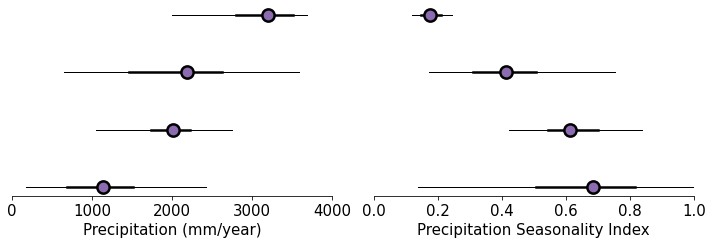

In [28]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(lat_min,lat_max,lon_min,lon_max)
dataframe_sav = savanna_dataframe(lat_min,lat_max,lon_min,lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > Sr_lower_threshold) & (dataframe_forest['Sr'] < Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,1)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

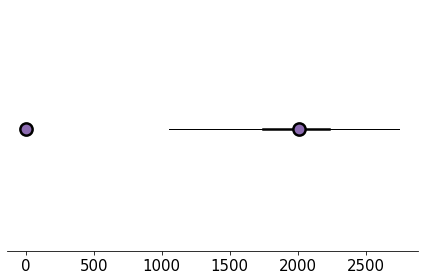

In [29]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))

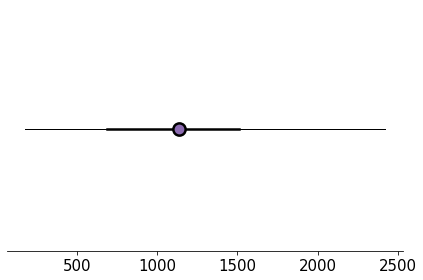

In [30]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [31]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [32]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [33]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

In [34]:
CMIP6_class_all_hist = {}

for model in tqdm(range(df_final.shape[0])):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
    CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
    CMIP6_Sr_interp_historical.close()
    temp = (CMIP6_Sr_interp_historical/CMIP6_Sr_interp_historical)
    
    a = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical <= df_final.iloc[model,9]).values
    a = (a/a)*1
    b = CMIP6_Sr_interp_historical.where((CMIP6_Sr_interp_historical > df_final.iloc[model,9]) & 
                                         (CMIP6_Sr_interp_historical <= df_final.iloc[model,10])).values
    b = (b/b)*2
    c = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical > df_final.iloc[model,10]).values
    c = (c/c)*3
    
    temp = (temp*np.nansum([a,b,c], axis = 0))
    CMIP6_class_all_hist['historical'+'.'+str(df_final.iloc[model,1])] = temp
    
#-----------------------------------------------------------------------------
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

hist_Sr_contour = np.zeros(Sr_contour.shape)
hist_Sr_contour[:] = np.nan

for Forest_class, i in zip(['LWSf','MWSf','HWSf'],[1,2,3]):
    b = combined_classification_all_WSf_historical_combined(CMIP6_class_all_hist, Forest_class)
    b = b.where(b>0.5)
    b = (b/b)*i
    hist_Sr_contour = np.nansum([b,hist_Sr_contour], axis = 0)
    #print(b.count())

hist_Sr_contour = (hist_Sr_contour*(Sr_contour/Sr_contour))
#hist_Sr_contour.plot(cmap = 'jet')
a = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

for lat in tqdm(range(hist_Sr_contour.shape[0])):
    for lon in range(hist_Sr_contour.shape[1]):
        if (hist_Sr_contour[lat,lon].values == 0):
            if a[lat,lon] <=Sr_lower_threshold:
                hist_Sr_contour[lat,lon] = 1
                continue
            if (a[lat,lon]>Sr_lower_threshold) & (a[lat,lon] <= Sr_upper_threshold):
                hist_Sr_contour[lat,lon] = 2
                continue
            if a[lat,lon] > Sr_upper_threshold:
                hist_Sr_contour[lat,lon] = 3
            #print(hist_Sr_contour[lat,lon].values)
        else:
            continue

100%|██████████| 200/200 [00:07<00:00, 26.51it/s]


In [35]:
SA_hist_Sr_contour = hist_Sr_contour

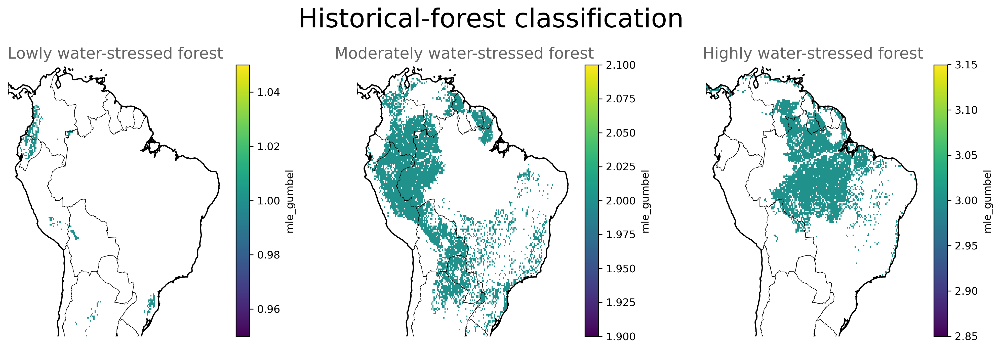

In [36]:
fig = plt.figure(figsize=(16,4.5), dpi = 300)
ax = [plt.subplot(131,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(132,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(133,projection=ccrs.PlateCarree(), aspect='auto')]

for Forest_class,j in zip([1,2,3],[0,1,2]):
    SA_hist_Sr_contour.where(SA_hist_Sr_contour == Forest_class).plot(ax = ax[j])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)
    #axs = inset_axes(ax[j], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[j].transAxes)
    #barchart_area_classes(SA_CMIP6_class_all_forest_savanna_corrected, hist_Sr_contour, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold,lat_min, lat_max, lon_min, lon_max, ax = axs)

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = '#636363');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = '#636363');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = '#636363');
fig.text(0.5, 1.01, 'Historical-forest classification', ha='center', fontsize = 25, color = 'black');
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.1)


----

In [37]:
save_folder = 'SA_hist-combined_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [38]:
keys = ['ssp126.ACCESS-CM2', 'ssp126.ACCESS-ESM1-5', 'ssp126.AWI-CM-1-1-MR', 'ssp126.BCC-CSM2-MR', 'ssp126.CAS-ESM2-0', 'ssp126.CESM2-WACCM', 'ssp126.CMCC-CM2-SR5', 'ssp126.CMCC-ESM2', 'ssp126.CanESM5', 'ssp126.EC-Earth3', 'ssp126.EC-Earth3-Veg-LR', 'ssp126.FGOALS-f3-L', 'ssp126.FGOALS-g3', 'ssp126.FIO-ESM-2-0', 'ssp126.GFDL-ESM4', 'ssp126.INM-CM4-8', 'ssp126.INM-CM5-0', 'ssp126.IPSL-CM6A-LR', 'ssp126.KACE-1-0-G', 'ssp126.MIROC6', 'ssp126.MPI-ESM1-2-HR', 'ssp126.MPI-ESM1-2-LR', 'ssp126.MRI-ESM2-0', 'ssp126.NESM3', 'ssp126.NorESM2-LM', 'ssp126.NorESM2-MM', 'ssp126.TaiESM1', 'ssp245.ACCESS-CM2', 'ssp245.AWI-CM-1-1-MR', 'ssp245.BCC-CSM2-MR', 'ssp245.CAS-ESM2-0', 'ssp245.CESM2-WACCM', 'ssp245.CMCC-CM2-SR5', 'ssp245.CMCC-ESM2', 'ssp245.CanESM5', 'ssp245.EC-Earth3', 'ssp245.EC-Earth3-CC', 'ssp245.EC-Earth3-Veg-LR', 'ssp245.FGOALS-f3-L', 'ssp245.FGOALS-g3', 'ssp245.FIO-ESM-2-0', 'ssp245.GFDL-CM4', 'ssp245.GFDL-ESM4', 'ssp245.IITM-ESM', 'ssp245.INM-CM4-8', 'ssp245.INM-CM5-0', 'ssp245.IPSL-CM6A-LR', 'ssp245.KACE-1-0-G', 'ssp245.MIROC6', 'ssp245.MPI-ESM1-2-HR', 'ssp245.MPI-ESM1-2-LR', 'ssp245.MRI-ESM2-0', 'ssp245.NESM3', 'ssp245.NorESM2-LM', 'ssp245.NorESM2-MM', 'ssp245.TaiESM1', 'ssp370.ACCESS-CM2', 'ssp370.AWI-CM-1-1-MR', 'ssp370.BCC-CSM2-MR', 'ssp370.CAS-ESM2-0', 'ssp370.CESM2-WACCM', 'ssp370.CMCC-CM2-SR5', 'ssp370.CMCC-ESM2', 'ssp370.CanESM5', 'ssp370.EC-Earth3', 'ssp370.EC-Earth3-AerChem', 'ssp370.EC-Earth3-Veg-LR', 'ssp370.FGOALS-f3-L', 'ssp370.FGOALS-g3', 'ssp370.GFDL-ESM4', 'ssp370.IITM-ESM', 'ssp370.INM-CM4-8', 'ssp370.INM-CM5-0', 'ssp370.IPSL-CM5A2-INCA', 'ssp370.IPSL-CM6A-LR', 'ssp370.KACE-1-0-G', 'ssp370.MIROC6', 'ssp370.MPI-ESM1-2-HR', 'ssp370.MPI-ESM1-2-LR', 'ssp370.MRI-ESM2-0', 'ssp370.NorESM2-LM', 'ssp370.NorESM2-MM', 'ssp370.TaiESM1', 'ssp585.ACCESS-CM2', 'ssp585.ACCESS-ESM1-5', 'ssp585.AWI-CM-1-1-MR', 'ssp585.BCC-CSM2-MR', 'ssp585.CAS-ESM2-0', 'ssp585.CESM2-WACCM', 'ssp585.CMCC-CM2-SR5', 'ssp585.CMCC-ESM2', 'ssp585.CanESM5', 'ssp585.E3SM-1-1', 'ssp585.EC-Earth3', 'ssp585.EC-Earth3-CC', 'ssp585.EC-Earth3-Veg-LR', 'ssp585.FGOALS-f3-L', 'ssp585.FGOALS-g3', 'ssp585.FIO-ESM-2-0', 'ssp585.GFDL-CM4', 'ssp585.GFDL-ESM4', 'ssp585.IITM-ESM', 'ssp585.INM-CM4-8', 'ssp585.INM-CM5-0', 'ssp585.IPSL-CM6A-LR', 'ssp585.KACE-1-0-G', 'ssp585.MIROC6', 'ssp585.MPI-ESM1-2-HR', 'ssp585.MPI-ESM1-2-LR', 'ssp585.MRI-ESM2-0', 'ssp585.NESM3', 'ssp585.NorESM2-MM', 'ssp585.TaiESM1']

In [39]:
SA_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 148.63it/s]


#### Running analysis

In [40]:
# For Africa
AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max = [-35,15,0,55]
if (AF_lon_min == 0) & (AF_lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'
AF_Sr_lower_threshold = 100
AF_Sr_upper_threshold = 350

Africa (Total Area) = 5611461.72376163 km^2

In [41]:
df_final = pd.read_csv(parent_dir+'/CMIP6-Future_models_all_(with Sr-eq)_Africa.csv')

In [42]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,121.113881,310.662721
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,206.084287,295.555795
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,121.608941,354.318473
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,67.826050,134.381436
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,49.693557,220.267113
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,129.916378,316.431578
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,110.769568,204.207156
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,122.625083,203.495422
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,258.612941,422.435308
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,110.789278,217.853644


In [43]:
CMIP6_class_all_hist = {}

for model in tqdm(range(df_final.shape[0])):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
    CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
    CMIP6_Sr_interp_historical.close()
    temp = (CMIP6_Sr_interp_historical/CMIP6_Sr_interp_historical)
    
    a = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical <= df_final.iloc[model,9]).values
    a = (a/a)*1
    b = CMIP6_Sr_interp_historical.where((CMIP6_Sr_interp_historical > df_final.iloc[model,9]) & 
                                         (CMIP6_Sr_interp_historical <= df_final.iloc[model,10])).values
    b = (b/b)*2
    c = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical > df_final.iloc[model,10]).values
    c = (c/c)*3
    
    temp = (temp*np.nansum([a,b,c], axis = 0))
    CMIP6_class_all_hist['historical'+'.'+str(df_final.iloc[model,1])] = temp

100%|██████████| 33/33 [00:00<00:00, 47.25it/s]


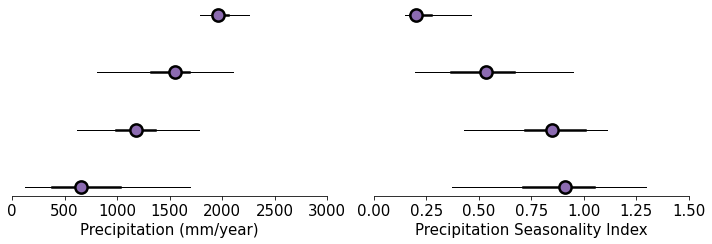

In [44]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
dataframe_sav = savanna_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= AF_Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > AF_Sr_lower_threshold) & (dataframe_forest['Sr'] < AF_Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,3000)
ax[1].set_xlim(0,1.5)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

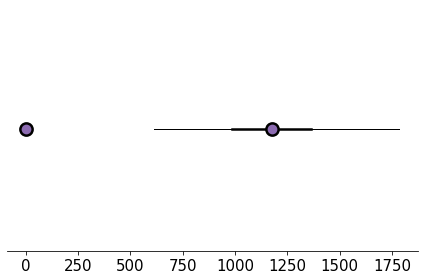

In [45]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))

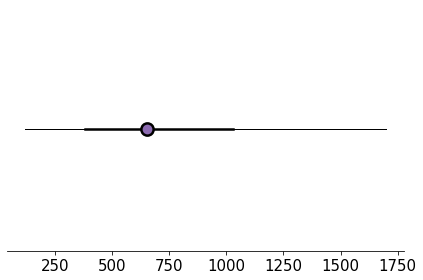

In [46]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [47]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [48]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [49]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

In [50]:
CMIP6_class_all_hist = {}

for model in tqdm(range(df_final.shape[0])):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
    CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
    CMIP6_Sr_interp_historical.close()
    temp = (CMIP6_Sr_interp_historical/CMIP6_Sr_interp_historical)
    
    a = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical <= df_final.iloc[model,9]).values
    a = (a/a)*1
    b = CMIP6_Sr_interp_historical.where((CMIP6_Sr_interp_historical > df_final.iloc[model,9]) & 
                                         (CMIP6_Sr_interp_historical <= df_final.iloc[model,10])).values
    b = (b/b)*2
    c = CMIP6_Sr_interp_historical.where(CMIP6_Sr_interp_historical > df_final.iloc[model,10]).values
    c = (c/c)*3
    
    temp = (temp*np.nansum([a,b,c], axis = 0))
    CMIP6_class_all_hist['historical'+'.'+str(df_final.iloc[model,1])] = temp
    
#-----------------------------------------------------------------------------
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

hist_Sr_contour = np.zeros(Sr_contour.shape)
hist_Sr_contour[:] = np.nan

for Forest_class, i in zip(['LWSf','MWSf','HWSf'],[1,2,3]):
    b = combined_classification_all_WSf_historical_combined(CMIP6_class_all_hist, Forest_class)
    b = b.where(b>0.5)
    b = (b/b)*i
    hist_Sr_contour = np.nansum([b,hist_Sr_contour], axis = 0)
    #print(b.count())

hist_Sr_contour = (hist_Sr_contour*(Sr_contour/Sr_contour))
#hist_Sr_contour.plot(cmap = 'jet')
a = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

for lat in tqdm(range(hist_Sr_contour.shape[0])):
    for lon in range(hist_Sr_contour.shape[1]):
        if (hist_Sr_contour[lat,lon].values == 0):
            if a[lat,lon] <=AF_Sr_lower_threshold:
                hist_Sr_contour[lat,lon] = 1
                continue
            if (a[lat,lon]>AF_Sr_lower_threshold) & (a[lat,lon] <= AF_Sr_upper_threshold):
                hist_Sr_contour[lat,lon] = 2
                continue
            if a[lat,lon] > AF_Sr_upper_threshold:
                hist_Sr_contour[lat,lon] = 3
            #print(hist_Sr_contour[lat,lon].values)
        else:
            continue

100%|██████████| 200/200 [00:04<00:00, 43.43it/s]


In [51]:
AF_hist_Sr_contour = hist_Sr_contour

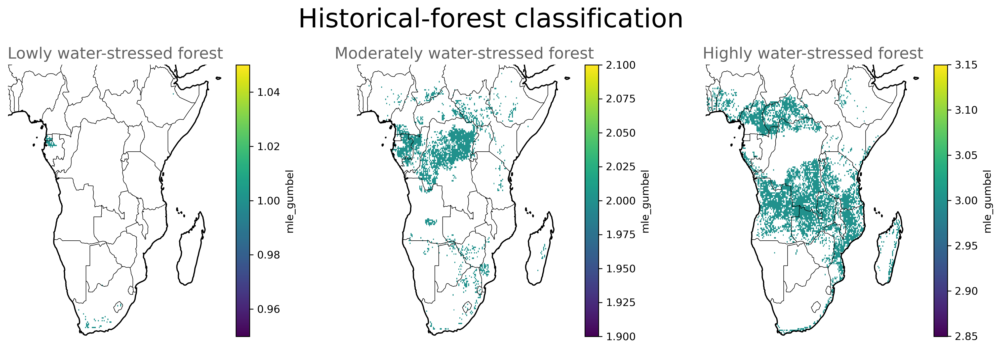

In [52]:
fig = plt.figure(figsize=(16,4.5), dpi = 300)
ax = [plt.subplot(131,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(132,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(133,projection=ccrs.PlateCarree(), aspect='auto')]

for Forest_class,j in zip([1,2,3],[0,1,2]):
    AF_hist_Sr_contour.where(AF_hist_Sr_contour == Forest_class).plot(ax = ax[j])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    #ax[j].set_xlim(-83,-34)
    #ax[j].set_ylim(-33,13)
    #axs = inset_axes(ax[j], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[j].transAxes)
    #barchart_area_classes(SA_CMIP6_class_all_forest_savanna_corrected, hist_Sr_contour, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold,lat_min, lat_max, lon_min, lon_max, ax = axs)

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = '#636363');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = '#636363');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = '#636363');
fig.text(0.5, 1.01, 'Historical-forest classification', ha='center', fontsize = 25, color = 'black');
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.1)


---

In [53]:
save_folder = 'AF_hist-combined_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [54]:
AF_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 153.28it/s]


## --------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [72]:
def barchart_area_classes_combined_plotting(CMIP6_class_all_forest_savanna_corrected, Sr_sel, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    #Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values == 1).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where(Sr_sel.values == 2).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values == 3).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    a,b,c = area
    color = ['#c2a5cf','#ffafbd','#e1e1e1']
    
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="....", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 10)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [73]:
def barchart_area_classes_custom_combined_plotting(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#c2a5cf','#ffafbd','#e1e1e1']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 10)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [57]:
def rectangle_combined_plots():
    global zorder
    for x_axis, color in zip([0.706,0.505,0.302,0.100], ['#de2d26','#dd7a2f','#2db08b','#308bc0']):
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.098, x_axis), 0.805, 0.195, fill=False, lw=1.2, 
            transform=fig.transFigure, figure=fig, alpha = 0.6, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.084, x_axis), 0.014, 0.195, lw=1.2, facecolor = color,
            transform=fig.transFigure, figure=fig, alpha = 0.4, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])

In [58]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [59]:
def combined_classification_all_WSf_future_custom_1(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [60]:
def combined_classification_all_WSf_future_custom_2(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [61]:
def calc_area_individually(array, lat_min, lat_max, lon_min, lon_max):
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    #Area.plot()
    #plt.show()
    #plt.imshow(array)
    #plt.show()
    Area_sum = Area.where(array>0).sum().values
    Area_sum = Area_sum/1000000 ## km2 x 10^6
    return Area_sum 

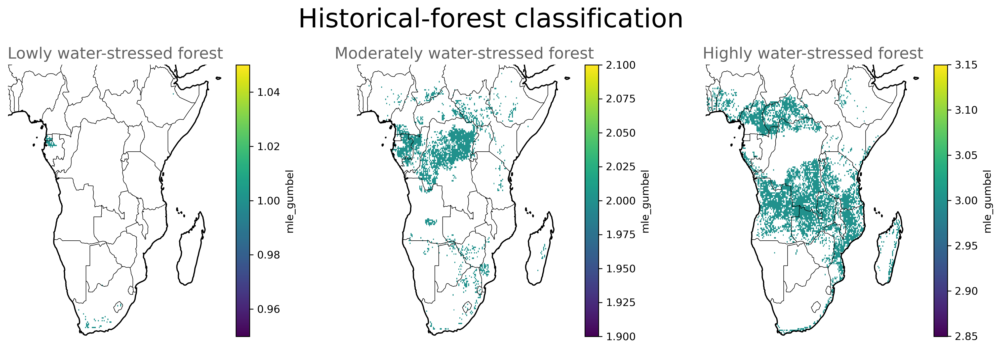

In [62]:
fig = plt.figure(figsize=(16,4.5), dpi = 300)
ax = [plt.subplot(131,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(132,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(133,projection=ccrs.PlateCarree(), aspect='auto')]

for Forest_class,j in zip([1,2,3],[0,1,2]):
    AF_hist_Sr_contour.where(AF_hist_Sr_contour == Forest_class).plot(ax = ax[j])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    #axs = inset_axes(ax[j], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[j].transAxes)
    #barchart_area_classes(SA_CMIP6_class_all_forest_savanna_corrected, hist_Sr_contour, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold,lat_min, lat_max, lon_min, lon_max, ax = axs)

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = '#636363');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = '#636363');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = '#636363');
fig.text(0.5, 1.01, 'Historical-forest classification', ha='center', fontsize = 25, color = 'black');
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.1)


In [63]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

In [64]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)
Sr_contour_AF = (Sr_sel/Sr_sel).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


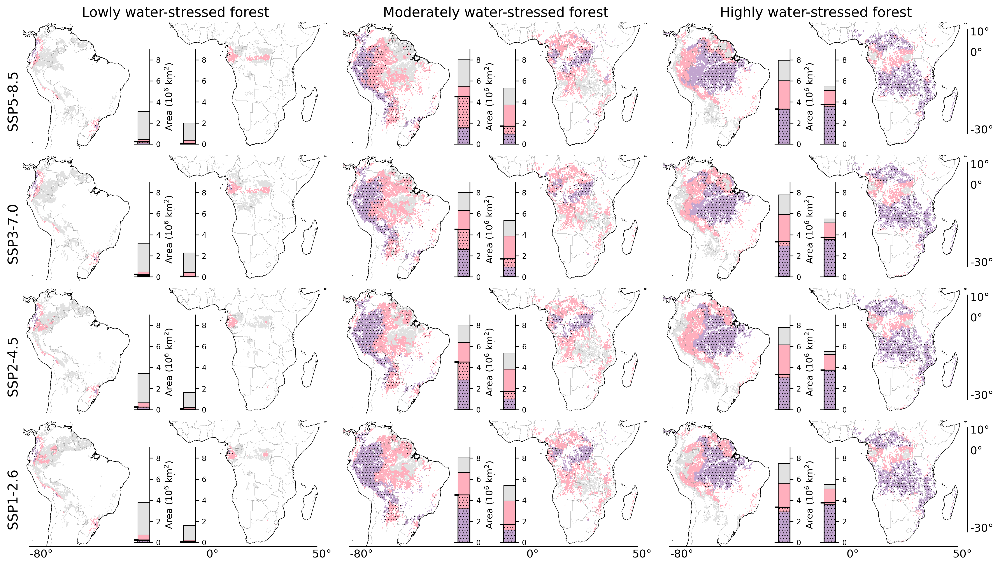

In [74]:
# 4x3 (without forest savanna transition)
plt.rcParams['hatch.linewidth'] = 0.5

fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]
"""
for i in [0,3,6,9]:
    ax[i+0].contourf(Sr_contour.where(Sr <=Sr_lower_threshold).lon.values, Sr_contour.where(Sr <=Sr_lower_threshold).lat.values, (Sr_contour.where(Sr <=Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lon.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lat.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values, lw = 0.05, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour.where(Sr >Sr_upper_threshold).lon.values, Sr_contour.where(Sr > Sr_upper_threshold).lat.values, (Sr_contour.where(Sr > Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], lw = 0.05, transform=cartopy.crs.PlateCarree(), zorder = 10)
"""
for i in [0,3,6,9]:
    ax[i].contourf(SA_hist_Sr_contour.where(SA_hist_Sr_contour == 1).lon.values, SA_hist_Sr_contour.where(SA_hist_Sr_contour == 1).lat.values, 
                   SA_hist_Sr_contour.where(SA_hist_Sr_contour == 1).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(SA_hist_Sr_contour.where(SA_hist_Sr_contour == 2).lon.values, SA_hist_Sr_contour.where(SA_hist_Sr_contour == 2).lat.values, 
                   SA_hist_Sr_contour.where(SA_hist_Sr_contour == 2).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(SA_hist_Sr_contour.where(SA_hist_Sr_contour == 3).lon.values, SA_hist_Sr_contour.where(SA_hist_Sr_contour == 3).lat.values, 
                   SA_hist_Sr_contour.where(SA_hist_Sr_contour == 3).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    
#rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -28, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    for Forest_class,j in zip(['LWSf','MWSf','HWSf'],[0,1,2]):
        combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot.contourf(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = colors)
        axs = inset_axes(ax[i+j], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SA_hist_Sr_contour, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax = axs)
    i = i+j+1 
"""
for i in [0,3,6,9]:
    ax[i+0].contourf(Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold).lon.values, Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold).lat.values, (Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lon.values, Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lat.values, Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).lon.values, Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).lat.values, (Sr_contour_AF.where(Sr > AF_Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
"""

for i in [0,3,6,9]:
    ax[i].contourf(AF_hist_Sr_contour.where(AF_hist_Sr_contour == 1).lon.values, AF_hist_Sr_contour.where(AF_hist_Sr_contour == 1).lat.values, 
                   AF_hist_Sr_contour.where(AF_hist_Sr_contour == 1).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(AF_hist_Sr_contour.where(AF_hist_Sr_contour == 2).lon.values, AF_hist_Sr_contour.where(AF_hist_Sr_contour == 2).lat.values, 
                   AF_hist_Sr_contour.where(AF_hist_Sr_contour == 2).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(AF_hist_Sr_contour.where(AF_hist_Sr_contour == 3).lon.values, AF_hist_Sr_contour.where(AF_hist_Sr_contour == 3).lat.values, 
                   AF_hist_Sr_contour.where(AF_hist_Sr_contour == 3).values, colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
  
i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    for Forest_class,j in zip(['LWSf','MWSf','HWSf'],[0,1,2]):
        combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot.contourf(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = colors)
        axs = inset_axes(ax[i+j], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, AF_hist_Sr_contour, SSP,Forest_class, AF_Sr_lower_threshold, AF_Sr_upper_threshold, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, axis_l = 0, ax = axs)
    i = i+j+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = 'black');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = 'black');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = 'black');

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)
#fig.savefig(parent_dir+'/Figures/Classification_all.svg', dpi=10, bbox_inches="tight")
fig.savefig(parent_dir+'/Figures/Supplementary_Fig9_Classification_forests(Historical-SSP).tif', dpi=500, bbox_inches="tight")

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


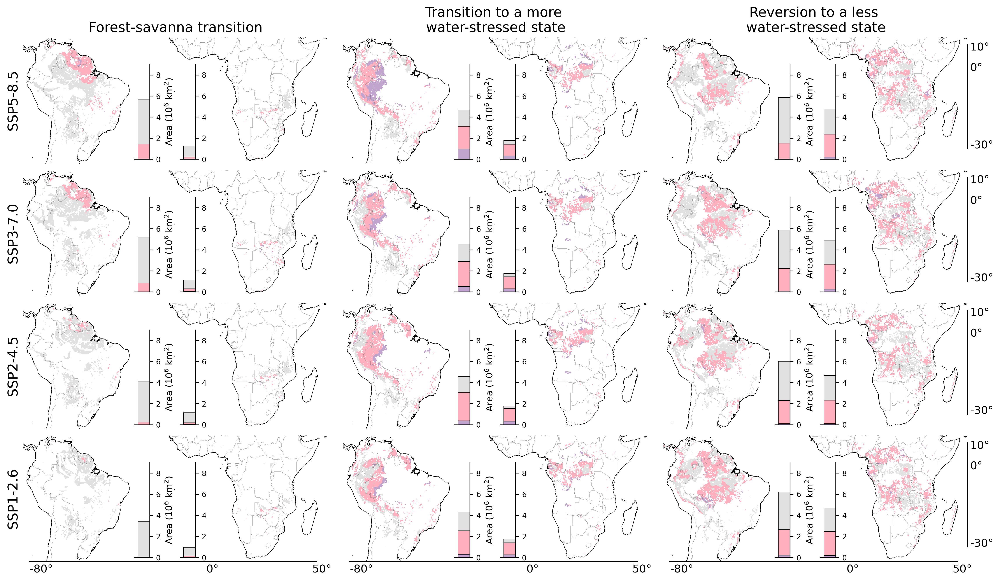

In [76]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

#rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    #ax[i].text(-87.5, -28, SSP_name, zorder = 10000)
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a more \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Reversion to a less \nwater-stressed state', fontsize = '15', color = 'black');

fig.savefig(parent_dir+'/Figures/Supplementary_Fig10_Transition_all_unsorted(historical-SSP).tif', dpi=500, bbox_inches="tight")

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


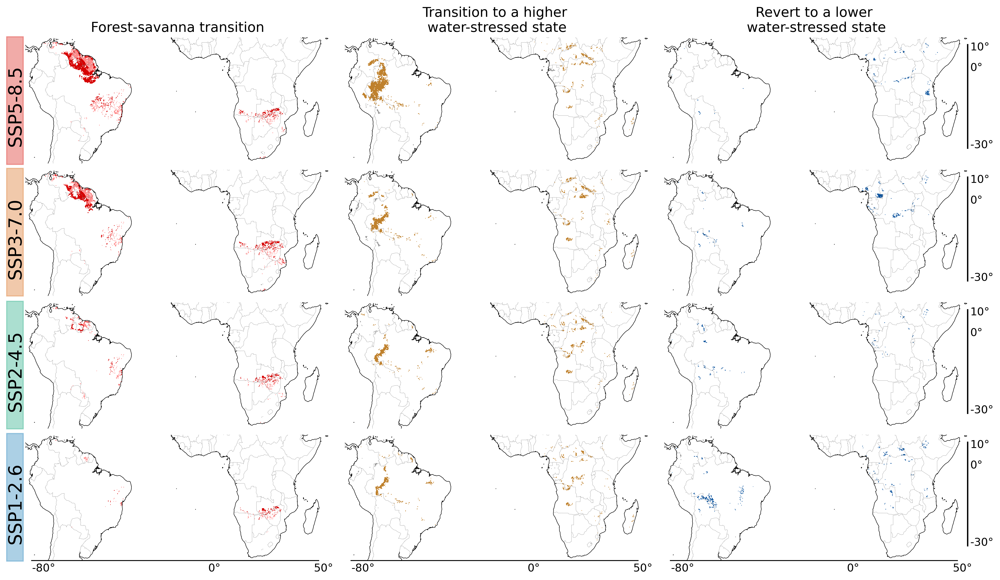

In [79]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

rectangle_combined_plots()
colors_tp = ['#FFFFFF','#969696','#FF8B8B','#D60000']
colors_ws = ['#FFFFFF','#969696','#DFC27D','#BF812D']
colors_wr = ['#FFFFFF','#969696','#6BAED6','#08519C']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -28, SSP_name, ha='center', fontsize = 20, color = 'black', zorder = 1000, rotation  = 90);
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a higher \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Revert to a lower \nwater-stressed state', fontsize = '15', color = 'black');

#fig.savefig(parent_dir+'/Figures/Transition_all.tif', dpi=500, bbox_inches="tight")

## ------------------------------------------------------------------------------------

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


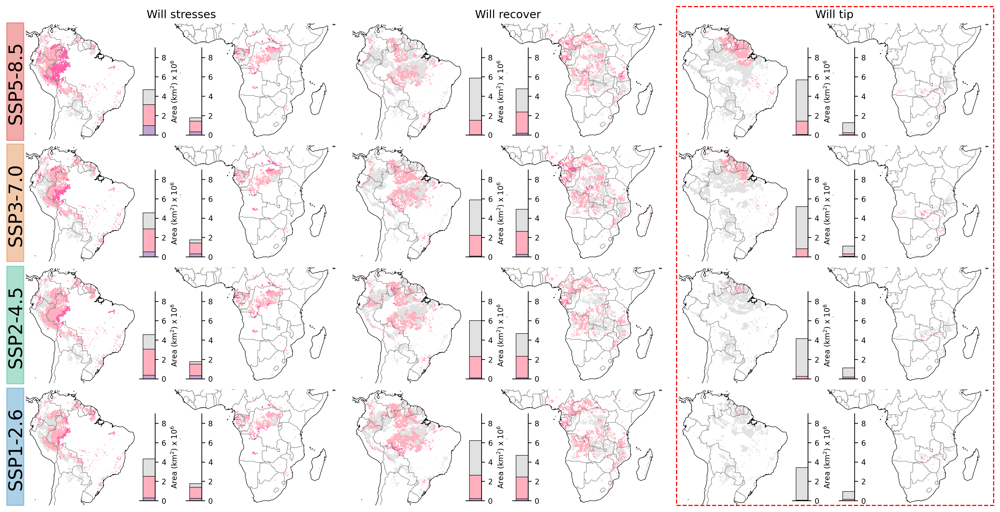

In [80]:
fig = plt.figure(figsize=(18,9), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#ff64a9']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -28, SSP_name, ha='center', fontsize = 20, color = 'black', zorder = 1000, rotation  = 90);
    #ax[i].text(-87.5, -28, SSP_name, zorder = 10000)
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, lat_min, lat_max, lon_min, lon_max, ax = axs)
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

rect = plt.Rectangle(
        # (lower-left corner), width, height
        (0.64, 0.100), 0.263, 0.828, lw=1.2, fill = False, linestyle = 'dashed',
        transform=fig.transFigure, figure=fig, edgecolor = '#FF0000', zorder = 1)
fig.patches.extend([rect])

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Will stresses', fontsize = '12', color = 'black');
ax[1].set_title('Will recover', fontsize = '12', color = 'black');
ax[2].set_title('Will tip', fontsize = '12', color = 'black');

SA (Tipping)- array([1.43229348, 0.84119614, 0.24390035, 0.04261751])
Tipping 17.72640446231688
SA (Will stress)- array([0.92077367, 0.4946577 , 0.34438855, 0.27404149])
HWSF 11.3957137409168
SA (will recover)- array([0.02086759, 0.04392029, 0.0615448 , 0.16819837])
Recovery 2.081663052943321
-----
AF (Tipping)- array([0.21762537, 0.29439675, 0.18511509, 0.13400089])
Tipping 5.333274456903793
AF (Will stress)- array([0.3028316 , 0.28914627, 0.29216248, 0.22341001])
HWSF 5.48607978221681
SA (Will recover)- array([0.10135549, 0.14866647, 0.04221726, 0.11718554])
Recovery 2.69323323683451
Check these values to set the ylim


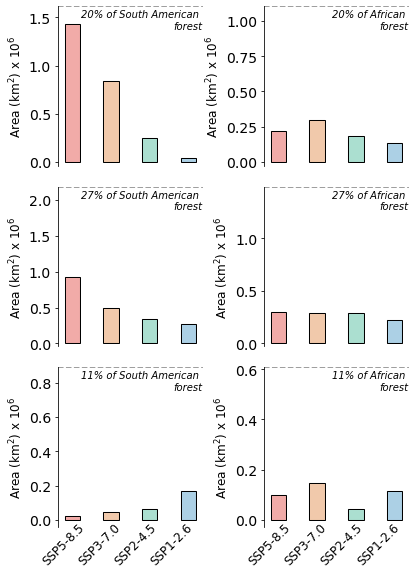

In [87]:
fig, ax = plt.subplots(3,2, figsize=(6,8))
from matplotlib.ticker import ScalarFormatter

class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

color = ['#de2d26','#dd7a2f','#2db08b','#308bc0']
a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
a = []

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('SA (Tipping)-', repr(a_ind))
a_axis.append(a_ind.max())
print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
for i in range(4):
    ax[0]
    ax[0][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[0][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [2,3,6]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('SA (Will stress)-', repr(a_ind))
a_axis.append(a_ind.max())
print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
for i in range(4):
    ax[1][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[1][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')
    
a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('SA (will recover)-', repr(a_ind))
a_axis.append(a_ind.max())
print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
for i in range(4):
    ax[2][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[2][0].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')
    
#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('AF (Tipping)-', repr(a_ind))
a_axis.append(a_ind.max())
print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
for i in range(4):
    ax[0][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[0][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [2,3,6]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('AF (Will stress)-', repr(a_ind))
a_axis.append(a_ind.max())
print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
for i in range(4):
    ax[1][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[1][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
print('SA (Will recover)-', repr(a_ind))
a_axis.append(a_ind.max())
print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
for i in range(4):
    ax[2][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = color[i], alpha = 0.4)
    ax[2][1].bar(i, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None')

#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 12)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=14)
    
#---- South America axes
Tipping_perc = 20
HWSF_perc = 27
Recovery_perc = 11

ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.25), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 12)
    ax[2][1].annotate(SSP_name,xy = (x,-0.25), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 12)

plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/Barplot_SSP.svg', dpi=10, bbox_inches="tight")

In [225]:
i = 8
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
    b = b.where(b > 0.5).values
    #print('SA', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
    print('SA',SSP, calc_area_individually(b,lat_min, lat_max, lon_min, lon_max).round(2))
    b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
    b = b.where(b > 0.5).values
    #print(SSP,calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
    print('AF',SSP, calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
    print('      ')
    

SA ssp585 0.15
AF ssp585 0.17
      
SA ssp370 0.35
AF ssp370 0.15
      
SA ssp245 0.36
AF ssp245 0.12
      
SA ssp126 0.57
AF ssp126 0.18
      


In [86]:
a_SA = calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max)
a_AF = calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
#print(a_SA)
#print(a_AF)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    AF = 0
    for i in [2,3,6]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    #print(SSP, ' SA-', SA, round(SA/a_SA*100, 4))
    print(SSP, ' AF-', AF, round(AF/a_AF*100, 4))
    

ssp585  AF- 0.30283160397836784 5.4859
ssp370  AF- 0.28914626888016276 5.238
ssp245  AF- 0.29216247708448084 5.2926
ssp126  AF- 0.2234100107727248 4.0471


Tipping 17.72640446231688
[1.43229348 0.84119614 0.24390035 0.04261751]
HWSF 10.891666655175634
[0.88004667 0.42957133 0.31226967 0.25555448]
Recovery 2.5408234226364423
[0.02390265 0.06519632 0.09589312 0.20529853]
-----
Tipping 5.333274456903793
[0.21762537 0.29439675 0.18511509 0.13400089]
HWSF 5.18617354452097
[0.28458192 0.28403341 0.28627678 0.220516  ]
Recovery 4.840447909599405
[0.18216908 0.26719272 0.09461619 0.18090342]
Check these values to set the ylim


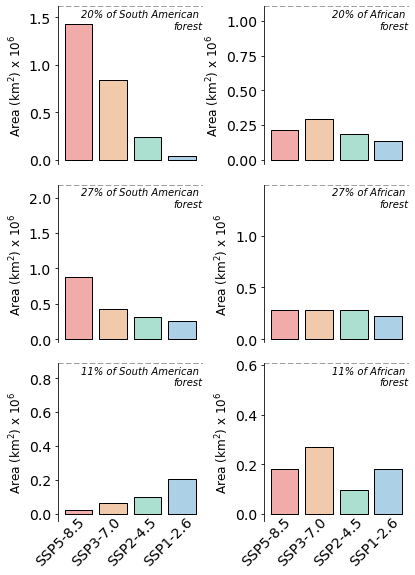

In [83]:
fig, ax = plt.subplots(3,2, figsize=(6,8))

color = ['#de2d26','#dd7a2f','#2db08b','#308bc0']
a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13)
    b = b.where(b > 0.2).values
    a.append(calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
a = np.array(a)
a_axis.append(a.max())
print('Tipping',(a/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[0][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[0][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')
    
a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom_2(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3,6)
    b = b.where(b > 0.5).values
    a.append(calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
a = np.array(a)
a_axis.append(a.max())
print('HWSF',(a/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[1][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[1][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')

a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8)
    b = b.where(b > 0.5).values
    a.append(calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
a = np.array(a)
a_axis.append(a.max())
print('Recovery',(a/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[2][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[2][0].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')

#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13)
    b = b.where(b > 0.2).values
    a.append(calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
a = np.array(a)
a_axis.append(a.max())
print('Tipping',(a/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[0][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[0][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')
    
a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom_2(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3,6)
    b = b.where(b > 0.5).values
    a.append(calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
a = np.array(a)
a_axis.append(a.max())
print('HWSF',(a/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[1][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[1][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')

a = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8)
    b = b.where(b > 0.5).values
    a.append(calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
a = np.array(a)
a_axis.append(a.max())
print('Recovery',(a/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
print(a)
for i in range(4):
    ax[2][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=0.9, color = color[i], alpha = 0.4)
    ax[2][1].bar(i, a[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None')

#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 12)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=14)
    
#---- South America axes
Tipping_perc = 20
HWSF_perc = 27
Recovery_perc = 11

ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.30), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 14)
    ax[2][1].annotate(SSP_name,xy = (x,-0.30), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 14)

plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/Barplot_SSP.svg', dpi=10, bbox_inches="tight")